# Q1.ipynb

# Team Members

- Kshitij Dahal - 1228236635
- Yash Rahul Bellap - 1228575454
- Atharva Gupta - 1222682656
- Rahul Pushparajan - 1226951910


## 1.A Numerical Estimation

In [20]:
from scipy.optimize import minimize
import numpy as np

# ReLU and neural network functions
def relu(x):
    return np.maximum(0, x)

def neural_network(x, W1, b1, W2, b2):
    z1 = relu(np.dot(W1, x) + b1)
    scores = np.dot(W2, z1) + b2
    return scores

# The objective function for the corrected dimensions
def objective_function(params, x1, x2, x3, x4):
    # Adjust unpacking parameters for the corrected architecture
    b1 = params[0:2]
    b2 = params[2:4]
    W1 = params[4:8].reshape((2, 2))  # Adjusted to match input dimension
    W2 = params[8:].reshape((2, 2))

    # The rest remains the same
    s1_x1, s2_x1 = neural_network(x1, W1, b1, W2, b2)
    s1_x2, s2_x2 = neural_network(x2, W1, b1, W2, b2)
    s1_x3, s2_x3 = neural_network(x3, W1, b1, W2, b2)
    s1_x4, s2_x4 = neural_network(x4, W1, b1, W2, b2)

    score_diff_class_1 = s1_x1 - s2_x1 + s1_x2 - s2_x2
    score_diff_class_2 = s2_x3 - s1_x3 + s2_x4 - s1_x4

    penalty = 0
    if score_diff_class_1 < 0:
        penalty += -score_diff_class_1
    if score_diff_class_2 < 0:
        penalty += -score_diff_class_2

    return penalty

# Adjusted initial guesses for parameters based on the new architecture
initial_params = np.random.rand(12)  # Adjusted for 4 biases and 8 weights

# Points remain the same
x1 = np.array([1, 0])
x2 = np.array([-1, 0])
x3 = np.array([0, 1])
x4 = np.array([0, -1])

# Use 'minimize' with the adjusted architecture
result = minimize(objective_function, initial_params, args=(x1, x2, x3, x4), method='SLSQP')

# Check if the optimizer found a solution and unpack the parameters
if result.success:
    fitted_params = result.x
    b1 = fitted_params[0:2]
    b2 = fitted_params[2:4]
    W1 = fitted_params[4:8].reshape((2, 2))
    W2 = fitted_params[8:].reshape((2, 2))
else:
    raise ValueError(result.message)

W1, b1, W2, b2


(array([[ 0.284434  , -0.02043755],
        [ 0.39682221,  1.12515239]]),
 array([-0.00844218,  0.06511235]),
 array([[0.38844932, 0.48575935],
        [0.02639142, 0.94189151]]),
 array([0.41821074, 0.24502462]))

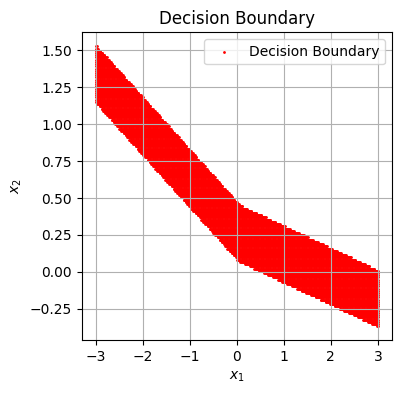

In [21]:
import matplotlib.pyplot as plt
import numpy as np


# # ReLU and neural network functions
# def relu(x):
#     return np.maximum(0, x)

# def neural_network(x, W1, b1, W2, b2):
#     z1 = relu(np.dot(W1, x) + b1)
#     scores = np.dot(W2, z1) + b2
#     return scores

# Generate a grid of points
x_range = np.linspace(-3, 3, 400)
y_range = np.linspace(-3, 3, 400)
xx, yy = np.meshgrid(x_range, y_range)
grid = np.c_[xx.ravel(), yy.ravel()]

# Evaluate the neural network on the grid
scores = np.array([neural_network(point, W1, b1, W2, b2) for point in grid])
# Compute the difference in scores
score_diff = scores[:, 0] - scores[:, 1]

# Identify points where s1 is approximately equal to s2
boundary_indices = np.where(np.abs(score_diff) < 0.1)[0]

# Plot
plt.figure(figsize=(4, 4))
plt.scatter(grid[boundary_indices, 0], grid[boundary_indices, 1], color='red', s=1, label='Decision Boundary')
plt.title('Decision Boundary')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.legend()
plt.grid(True)
plt.show()


## 1.B Using Pytorch

Test Accuracy: 90.00 %


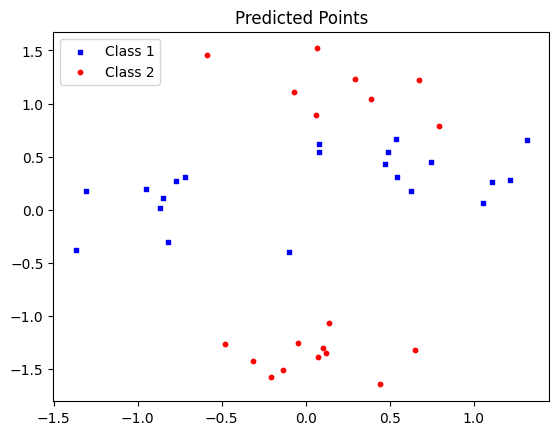

In [17]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read and shuffle the dataset
df = pd.read_csv('data_HW2_ex1.csv').sample(frac=1).reset_index(drop=True)

# Split into features and targets
x = np.column_stack((df['x1'].values, df['x2'].values))
y = df['class'].values

# One-hot encoding of the target variable
y = np.eye(y.max() + 1)[y]

# Convert arrays to PyTorch tensors
x_tensor = torch.tensor(x, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32)

# Split into training and testing datasets
n_samples = x_tensor.shape[0]
n_train = int(0.8 * n_samples)

x_train, x_test = x_tensor[:n_train], x_tensor[n_train:]
y_train, y_test = y_tensor[:n_train], y_tensor[n_train:]

# Create DataLoader for training and testing
train_dataset = TensorDataset(x_train, y_train)
test_dataset = TensorDataset(x_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Define the neural network architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(2, 2)  # Input layer to hidden layer
        self.fc2 = nn.Linear(2, 3)  # Hidden layer to output layer

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.softmax(self.fc2(x), dim=1)
        return x

model = Net()

# Define loss function and optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

# Training the model
for epoch in range(1000):  # Loop over the dataset multiple times
    for inputs, labels in train_loader:
        optimizer.zero_grad()  # Zero the parameter gradients
        outputs = model(inputs)  # Forward pass
        loss = criterion(outputs, labels)
        loss.backward()  # Backward pass
        optimizer.step()  # Optimize

# Evaluate the model
correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        _, labels_max = torch.max(labels, 1)
        total += labels.size(0)
        correct += (predicted == labels_max).sum().item()

print('Test Accuracy: %.2f %%' % (100 * correct / total))

# Visualization of predicted points
predicted_op = []
x_test_np = x_test.numpy()
for inputs, _ in test_loader:
    outputs = model(inputs)
    predicted_op.extend(outputs.argmax(dim=1).numpy())

class_1x, class_1y, class_2x, class_2y = [], [], [], []
for i, pred in enumerate(predicted_op):
    if pred == 1:
        class_1x.append(x_test_np[i][0])
        class_1y.append(x_test_np[i][1])
    else:
        class_2x.append(x_test_np[i][0])
        class_2y.append(x_test_np[i][1])

fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(class_1x, class_1y, s=10, c='b', marker="s", label='Class 1')
ax1.scatter(class_2x, class_2y, s=10, c='r', marker="o", label='Class 2')
plt.title("Predicted Points")
plt.legend(loc='upper left')
plt.show()


In [18]:

# Access weights and biases for the first layer (fc1)
fc1_weights = model.fc1.weight.data.numpy()
fc1_biases = model.fc1.bias.data.numpy()

# Access weights and biases for the second layer (fc2)
fc2_weights = model.fc2.weight.data.numpy()
fc2_biases = model.fc2.bias.data.numpy()

print("First Layer Weights:\n", fc1_weights)
print("First Layer Biases:\n", fc1_biases)
print("Second Layer Weights:\n", fc2_weights)
print("Second Layer Biases:\n", fc2_biases)


First Layer Weights:
 [[ 0.64495283 -3.5039728 ]
 [-0.38894176  3.629478  ]]
First Layer Biases:
 [-0.8495087 -0.2447468]
Second Layer Weights:
 [[-1.176986   -2.490183  ]
 [-1.3609371  -0.83728796]
 [ 1.8532492   1.5575299 ]]
Second Layer Biases:
 [-2.862711   3.2643847 -1.9675131]


## Lets compare accuracy with numerically estimated in 1.a

In [19]:
import pandas as pd
import numpy as np


# Neural network function using the optimized weights and biases
def neural_network(x, W1, b1, W2, b2):
    z1 = relu(np.dot(W1, x) + b1)
    scores = np.dot(W2, z1) + b2
    return scores

# Function to predict class based on neural network output
def predict_class(x, W1, b1, W2, b2):
    scores = neural_network(x, W1, b1, W2, b2)
    return np.argmax(scores)

# Load dataset
df = pd.read_csv('data_HW2_ex1.csv').sample(frac=1).reset_index(drop=True)
x = np.column_stack((df['x1'].values, df['x2'].values))
y = df['class'].values
y_one_hot = np.eye(y.max() + 1)[y]

# Predict classes for the dataset
y_pred = np.array([predict_class(xi, W1, b1, W2, b2) for xi in x])

# Calculate accuracy
accuracy = np.mean(y_pred == y)
print(f'Test Accuracy: {accuracy * 100:.2f}%')


Test Accuracy: 25.00%


The model solved numerically was only able to get accuracy around 25% which is significantly lower than trained on PyTorch module.

# Q2.ipynb

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

In [ ]:
# Set device (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
from torchvision import datasets
from torch.utils.data import DataLoader
import pandas as pd



#---A) Hyper Parameters
cfg = dict()
cfg['numEpoch'] = 30 #epochs
cfg['learning_rate'] = .0001 #learning rate
cfg['batchSize'] = 20 # batchSize

#--B) Intialization
#B.1 - loader
MNIST_training_set= datasets.FashionMNIST(root='data_fashionMNIST', train=True, download=True, transform=transforms.ToTensor() )
MNIST_test_set = datasets.FashionMNIST(root='data_fashionMNIST', train=False, download=True, transform=transforms.ToTensor())
myLoader_train = DataLoader(MNIST_training_set,shuffle=True,batch_size=cfg['batchSize'])
myLoader_test = DataLoader(MNIST_test_set,shuffle=False,batch_size=cfg['batchSize']) # no point in shuffling test set

N_train = len(MNIST_training_set) # number of images in the training set
N_test = len(MNIST_test_set)

num_mini_batch_train = len(myLoader_train)
num_mini_batch_test = len(myLoader_test)

/var/folders/br/rzkf1nz907qd3q234g81vfm00000gn/T/ipykernel_70759/550292466.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


## A) Linear Model

In [ ]:
def trainModel(optimizer,myMod,df,myLoss,cfg,Loader_test=myLoader_test, Loader_train = myLoader_train):
    num_mini_batch_train = len(Loader_train)
    num_mini_batch_test = len(Loader_test)
    for epoch in range(cfg['numEpoch']):
        print("--epoch",epoch)
        #--C.1) Train
        running_loss_train = 0.0
        accuracy_train = 0.0
        myMod.train()
        for I,y in Loader_train:
            I,y = I.to(device),y.to(device)
            #1) set gradient loss to zero
            optimizer.zero_grad()
            #2) get score and loss
            score = myMod(I)
            loss = myLoss(score,y)
            #3) estimate gradient and update paramters
            loss.backward()
            optimizer.step()
            #4) estimate loss and accuracy over the training set
            running_loss_train+= loss.detach().numpy()
            accuracy_train+=(score.argmax(dim=1)==y).sum().numpy()
        #--C.2) Test
        running_test_loss = 0.0
        accuracy_test = 0.0
        myMod.eval()
        with torch.no_grad():
            for I,y in Loader_test:
                score = myMod(I)
                loss = myLoss(score,y)
                #estimate loss and accuracy
                running_test_loss+=loss.detach().numpy()
                accuracy_test+=(score.argmax(dim=1)==y).sum().numpy()
        #end of epoch
        loss_train = running_loss_train/num_mini_batch_train
        loss_test = running_test_loss/num_mini_batch_test
        accuracy_train /= N_train
        accuracy_test /= N_test
        print('    loss     (train, test): {:.4f},  {:.4f}'.format(loss_train, loss_test))
        print('    accuracy (train, test): {:.4f},  {:.4f}'.format(accuracy_train, accuracy_test))
        df.loc[epoch] = [epoch, loss_train, loss_test, accuracy_train, accuracy_test]

In [ ]:
# Define the linear classifier model
class LinearClassifier(nn.Module):
    def __init__(self):
        super(LinearClassifier, self).__init__()
        self.pool1 = nn.MaxPool2d(4)
        self.fc = nn.Linear(49, 10)

    def forward(self, x):
        x1 = self.pool1(x)
        x2 = x1.view(x1.size(0), -1)  # Flatten the input
        x3 = self.fc(x2)
        return x3

In [ ]:
myMod_Linear = LinearClassifier().to(device)
sum(p.numel() for p in myMod_Linear.parameters() if p.requires_grad)

500

Linear Model Parameters = 500


In [ ]:
#B.2 optimizer
optimizer_Linear = torch.optim.Adam(myMod_Linear.parameters(),lr=cfg['learning_rate'])

#B.3 Loss
myLoss_Linear = nn.CrossEntropyLoss()

#B.4
df_Linear = pd.DataFrame(index=range(cfg['numEpoch']),columns=('epoch', 'loss_train', 'loss_test','accuracy_train','accuracy_test'))

trainModel(optimizer_Linear,myMod_Linear,df_Linear,myLoss_Linear,cfg,Loader_test=myLoader_test, Loader_train = myLoader_train)


--epoch 0
    loss     (train, test): 1.8120,  1.4526
    accuracy (train, test): 0.4615,  0.5662
--epoch 1
    loss     (train, test): 1.2869,  1.1763
    accuracy (train, test): 0.5874,  0.5940
--epoch 2
    loss     (train, test): 1.1001,  1.0559
    accuracy (train, test): 0.6102,  0.6138
--epoch 3
    loss     (train, test): 1.0071,  0.9879
    accuracy (train, test): 0.6313,  0.6344
--epoch 4
    loss     (train, test): 0.9507,  0.9440
    accuracy (train, test): 0.6517,  0.6488
--epoch 5
    loss     (train, test): 0.9123,  0.9127
    accuracy (train, test): 0.6673,  0.6644
--epoch 6
    loss     (train, test): 0.8839,  0.8893
    accuracy (train, test): 0.6774,  0.6764
--epoch 7
    loss     (train, test): 0.8620,  0.8706
    accuracy (train, test): 0.6865,  0.6812
--epoch 8
    loss     (train, test): 0.8445,  0.8552
    accuracy (train, test): 0.6926,  0.6872
--epoch 9
    loss     (train, test): 0.8299,  0.8433
    accuracy (train, test): 0.6979,  0.6910
--epoch 10
    loss 

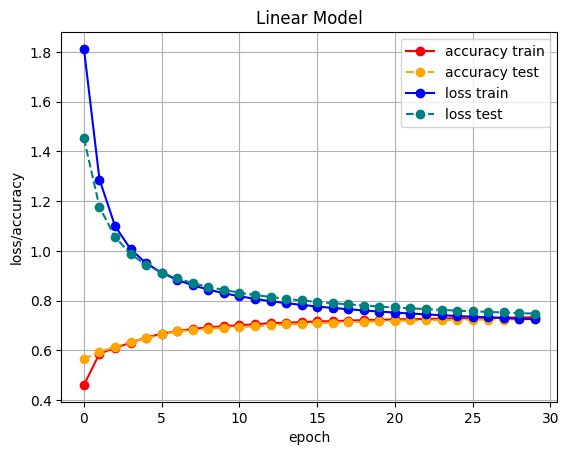

In [ ]:
from matplotlib import pyplot as plt
plt.figure(1)
plt.clf()
plt.title('Linear Model')
plt.plot(df_Linear['epoch'],df_Linear['accuracy_train'],marker='o',color='red')
plt.plot(df_Linear['epoch'],df_Linear['accuracy_test'],marker='o',color='orange',linestyle='dashed')
plt.plot(df_Linear['epoch'],df_Linear['loss_train'],marker='o',color='blue')
plt.plot(df_Linear['epoch'],df_Linear['loss_test'],marker='o',color='teal',linestyle='dashed')
plt.grid()
plt.xlabel(r'epoch')
plt.ylabel(r'loss/accuracy')
plt.legend(['accuracy train','accuracy test','loss train','loss test'])
plt.show()

## B) Multi-Layer Perceptron (MLP)

In [ ]:
#define MLP classifier
class MlpClassifier(nn.Module):
    def __init__(self):
        super(MlpClassifier, self).__init__()
        self.pool1 = nn.MaxPool2d(5)
        self.fc1 = nn.Linear(25,13 )
        self.fc2 = nn.Linear(13,10 )

    def forward(self, x):
        x1 = self.pool1(x)
        x2 = x1.view(x1.size(0), -1)  # Flatten the input
        x3 = F.relu(self.fc1(x2))
        x4 = self.fc2(x3)
        return x4

In [ ]:
myMod_MLP = MlpClassifier().to(device)
sum(p.numel() for p in myMod_MLP.parameters() if p.requires_grad)

478

MLP Classifier Parameters = 478

In [ ]:
#B.2 optimizer
optimizer_MLP = torch.optim.Adam(myMod_MLP.parameters(),lr=cfg['learning_rate'])

#B.3 Loss
myLoss_MLP = nn.CrossEntropyLoss()

#B.4
df_MLP = pd.DataFrame(index=range(cfg['numEpoch']),columns=('epoch', 'loss_train', 'loss_test','accuracy_train','accuracy_test'))

trainModel(optimizer_MLP,myMod_MLP,df_MLP,myLoss_MLP,cfg,Loader_test=myLoader_test, Loader_train = myLoader_train)

--epoch 0
    loss     (train, test): 2.0452,  1.7093
    accuracy (train, test): 0.2884,  0.4782
--epoch 1
    loss     (train, test): 1.4750,  1.3154
    accuracy (train, test): 0.5354,  0.5772
--epoch 2
    loss     (train, test): 1.2125,  1.1412
    accuracy (train, test): 0.5864,  0.5897
--epoch 3
    loss     (train, test): 1.0825,  1.0510
    accuracy (train, test): 0.5941,  0.5984
--epoch 4
    loss     (train, test): 1.0133,  0.9984
    accuracy (train, test): 0.6047,  0.6085
--epoch 5
    loss     (train, test): 0.9696,  0.9624
    accuracy (train, test): 0.6163,  0.6227
--epoch 6
    loss     (train, test): 0.9383,  0.9361
    accuracy (train, test): 0.6322,  0.6412
--epoch 7
    loss     (train, test): 0.9145,  0.9152
    accuracy (train, test): 0.6473,  0.6491
--epoch 8
    loss     (train, test): 0.8962,  0.8990
    accuracy (train, test): 0.6558,  0.6573
--epoch 9
    loss     (train, test): 0.8817,  0.8854
    accuracy (train, test): 0.6605,  0.6641
--epoch 10
    loss 

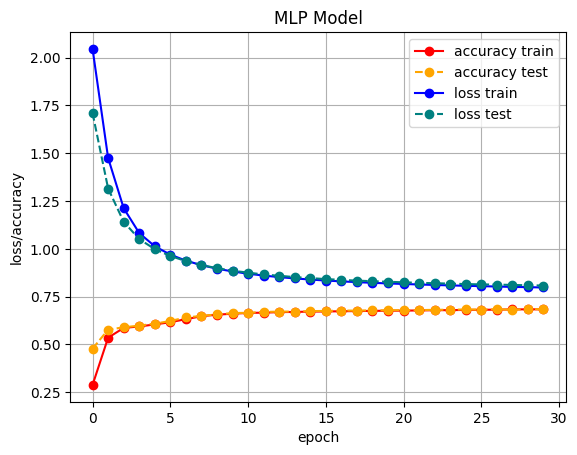

In [ ]:
from matplotlib import pyplot as plt
plt.figure(2)
plt.clf()
plt.title('MLP Model')
plt.plot(df_MLP['epoch'],df_MLP['accuracy_train'],marker='o',color='red')
plt.plot(df_MLP['epoch'],df_MLP['accuracy_test'],marker='o',color='orange',linestyle='dashed')
plt.plot(df_MLP['epoch'],df_MLP['loss_train'],marker='o',color='blue')
plt.plot(df_MLP['epoch'],df_MLP['loss_test'],marker='o',color='teal',linestyle='dashed')
plt.grid()
plt.xlabel(r'epoch')
plt.ylabel(r'loss/accuracy')
plt.legend(['accuracy train','accuracy test','loss train','loss test'])
plt.show()

## C) CNN Classifier

In [ ]:
class MyCNN(nn.Module):
    def __init__(self):
        super(MyCNN,self).__init__()  # call the constructor of the parent class
        super(MyCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 3, 3)
        self.conv2 = nn.Conv2d(3,3,3)
        self.conv3 = nn.Conv2d(3, 5, 3)

        self.pool1 = nn.MaxPool2d(2)
        self.pool2 = nn.MaxPool2d(2)
        self.pool3 = nn.MaxPool2d(2)

        self.bn1 = nn.BatchNorm2d(3)
        self.bn2 = nn.BatchNorm2d(3)
        self.bn3 = nn.BatchNorm2d(5)

        self.fc = nn.Linear(5 * 2 * 2, 10)
        #self.bnL = nn.BatchNorm1d(10)

        #self.dropout = nn.Dropout(p=0.3)


    def forward(self, x):


        x1 = self.pool1(self.bn1(F.relu(self.conv1(x))))
        x2 = self.pool2(self.bn2(F.relu( F.pad(self.conv2(x1),(0,1,0,1)))))
        x3 = self.pool3(self.bn3(F.relu(self.conv3(x2))))
       # x4 = self.dropout(x3)
        score = self.fc(x3.view(-1, 5 * 2 * 2))
        return score

In [ ]:
myMod_CNN = MyCNN().to(device)
sum(p.numel() for p in myMod_CNN.parameters() if p.requires_grad)

486

CNN Model Parameters = 486

In [ ]:
#B.2 optimizer
optimizer_CNN = torch.optim.Adam(myMod_CNN.parameters(),lr=cfg['learning_rate'])

#B.3 Loss
myLoss_CNN = nn.CrossEntropyLoss()

#B.4
df_CNN = pd.DataFrame(index=range(cfg['numEpoch']),columns=('epoch', 'loss_train', 'loss_test','accuracy_train','accuracy_test'))

trainModel(optimizer_CNN,myMod_CNN,df_CNN,myLoss_CNN,cfg,Loader_test=myLoader_test, Loader_train = myLoader_train)

--epoch 0
    loss     (train, test): 1.5430,  1.0651
    accuracy (train, test): 0.5072,  0.6688
--epoch 1
    loss     (train, test): 0.9017,  0.8022
    accuracy (train, test): 0.6972,  0.7168
--epoch 2
    loss     (train, test): 0.7578,  0.7279
    accuracy (train, test): 0.7277,  0.7340
--epoch 3
    loss     (train, test): 0.7027,  0.6840
    accuracy (train, test): 0.7421,  0.7483
--epoch 4
    loss     (train, test): 0.6692,  0.6545
    accuracy (train, test): 0.7536,  0.7594
--epoch 5
    loss     (train, test): 0.6457,  0.6347
    accuracy (train, test): 0.7619,  0.7674
--epoch 6
    loss     (train, test): 0.6281,  0.6180
    accuracy (train, test): 0.7700,  0.7753
--epoch 7
    loss     (train, test): 0.6144,  0.6076
    accuracy (train, test): 0.7753,  0.7765
--epoch 8
    loss     (train, test): 0.6031,  0.5955
    accuracy (train, test): 0.7797,  0.7797
--epoch 9
    loss     (train, test): 0.5941,  0.5860
    accuracy (train, test): 0.7827,  0.7829
--epoch 10
    loss 

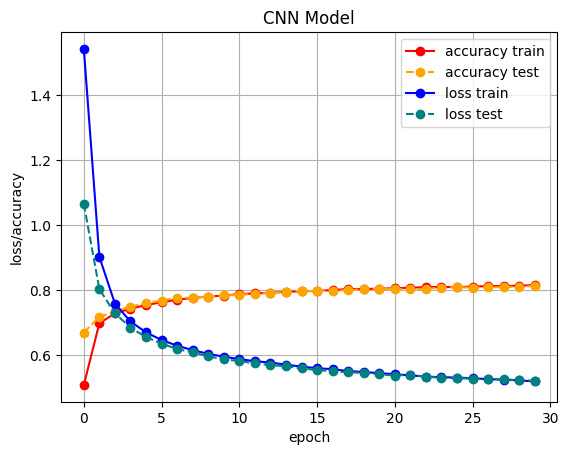

In [ ]:
from matplotlib import pyplot as plt
plt.figure(3)
plt.clf()
plt.title('CNN Model')
plt.plot(df_CNN['epoch'],df_CNN['accuracy_train'],marker='o',color='red')
plt.plot(df_CNN['epoch'],df_CNN['accuracy_test'],marker='o',color='orange',linestyle='dashed')
plt.plot(df_CNN['epoch'],df_CNN['loss_train'],marker='o',color='blue')
plt.plot(df_CNN['epoch'],df_CNN['loss_test'],marker='o',color='teal',linestyle='dashed')
plt.grid()
plt.xlabel(r'epoch')
plt.ylabel(r'loss/accuracy')
plt.legend(['accuracy train','accuracy test','loss train','loss test'])
plt.show()

## Comparision of Accuracy for All 3 Models


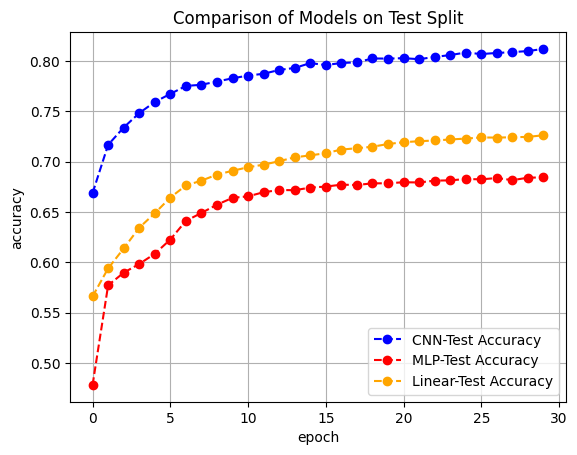

In [ ]:
from matplotlib import pyplot as plt
plt.figure(4)
plt.clf()
plt.title('Comparison of Models on Test Split')
plt.plot(df_CNN['epoch'],df_CNN['accuracy_test'],marker='o',color='blue',linestyle='dashed')
plt.plot(df_MLP['epoch'],df_MLP['accuracy_test'],marker='o',color='red',linestyle='dashed')
plt.plot(df_Linear['epoch'],df_Linear['accuracy_test'],marker='o',color='orange',linestyle='dashed')
plt.grid()
plt.xlabel(r'epoch')
plt.ylabel(r'accuracy')
plt.legend(['CNN-Test Accuracy','MLP-Test Accuracy','Linear-Test Accuracy'])
plt.show()

# Q3.ipynb

## 3.A)

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import numpy as np
import os
from PIL import Image
import zipfile

In [33]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [34]:
# Configuration file
cfg = {
    "path_data": ".",
    "shouldPretrained": True,
    "shouldFreeze": True,
    "nbr_classes": 102
}

In [35]:
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((240, 240)),
    transforms.ToTensor(),
])

In [36]:
# A) Load the data (train and test sets)
trainset = datasets.Flowers102(root=cfg["path_data"], split='train', download=True, transform=transform)
testset = datasets.Flowers102(root=cfg["path_data"], split='val', download=True, transform=transform)

In [37]:
# Define dataloaders
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=32, shuffle=False)

## A) Train a baseline model (linear model or CNN) and report the loss and accuracy on both train and test sets

In [38]:
# Define a simple CNN model as the baseline
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.fc1 = nn.Linear(64 * 60 * 60, 512)
        self.fc2 = nn.Linear(512, cfg["nbr_classes"])  # 102 classes

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = torch.flatten(x, 1)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [39]:
# Initialize the model, loss function, and optimizer
model_baseline = SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model_baseline.parameters(), lr=0.001, momentum=0.9)

In [40]:
# # Training the baseline model
# epochs = 100
# for epoch in range(epochs):
#     running_loss = 0.0
#     for i, data in enumerate(trainloader, 0):
#         inputs, labels = data[0].to(device), data[1].to(device)
#         optimizer.zero_grad()
#         outputs = model_baseline(inputs)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()
#         running_loss += loss.item()
#     print(f'Epoch {epoch+1}, Loss: {running_loss / len(trainloader)}')

In [42]:
# Lists to keep track of metrics
epoch_losses = []
epoch_train_accuracies = []
epoch_test_losses = []
epoch_test_accuracies = []

epochs = 30
for epoch in range(epochs):
    model_baseline.train()  # Set the model to training mode
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    # Training loop
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        outputs = model_baseline(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        # Calculate training accuracy
        _, train_predicted = torch.max(outputs.data, 1)
        train_total += labels.size(0)
        train_correct += (train_predicted == labels).sum().item()

    epoch_loss = running_loss / len(trainloader)
    epoch_train_accuracy = train_correct / train_total
    epoch_losses.append(epoch_loss)
    epoch_train_accuracies.append(epoch_train_accuracy)

    # Evaluation loop for test data
    model_baseline.eval()  # Set the model to evaluation mode
    test_loss = 0.0
    test_correct = 0
    test_total = 0
    with torch.no_grad():
        for data in testloader:
            inputs, labels = data[0].to(device), data[1].to(device)
            outputs = model_baseline(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            # Calculate test accuracy
            _, test_predicted = torch.max(outputs.data, 1)
            test_total += labels.size(0)
            test_correct += (test_predicted == labels).sum().item()

    epoch_test_loss = test_loss / len(testloader)
    epoch_test_accuracy = test_correct / test_total
    epoch_test_losses.append(epoch_test_loss)
    epoch_test_accuracies.append(epoch_test_accuracy)

    print(f'Epoch {epoch+1}, Training Loss: {epoch_loss}, Training Accuracy: {epoch_train_accuracy}, Test Loss: {epoch_test_loss}, Test Accuracy: {epoch_test_accuracy}')


Epoch 1, Training Loss: 0.0010539546983636683, Training Accuracy: 1.0, Test Loss: 6.740503124892712, Test Accuracy: 0.1480392156862745
Epoch 2, Training Loss: 0.0010270277580275433, Training Accuracy: 1.0, Test Loss: 6.758627712726593, Test Accuracy: 0.14705882352941177
Epoch 3, Training Loss: 0.0009892520465655252, Training Accuracy: 1.0, Test Loss: 6.777453318238258, Test Accuracy: 0.1480392156862745
Epoch 4, Training Loss: 0.0009632533619878814, Training Accuracy: 1.0, Test Loss: 6.79237274825573, Test Accuracy: 0.14705882352941177
Epoch 5, Training Loss: 0.0009409918811797979, Training Accuracy: 1.0, Test Loss: 6.810369908809662, Test Accuracy: 0.14901960784313725
Epoch 6, Training Loss: 0.0009107419409701834, Training Accuracy: 1.0, Test Loss: 6.826576955616474, Test Accuracy: 0.14901960784313725
Epoch 7, Training Loss: 0.0008875426910890383, Training Accuracy: 1.0, Test Loss: 6.84237639605999, Test Accuracy: 0.14705882352941177
Epoch 8, Training Loss: 0.0008636799484520452, Train

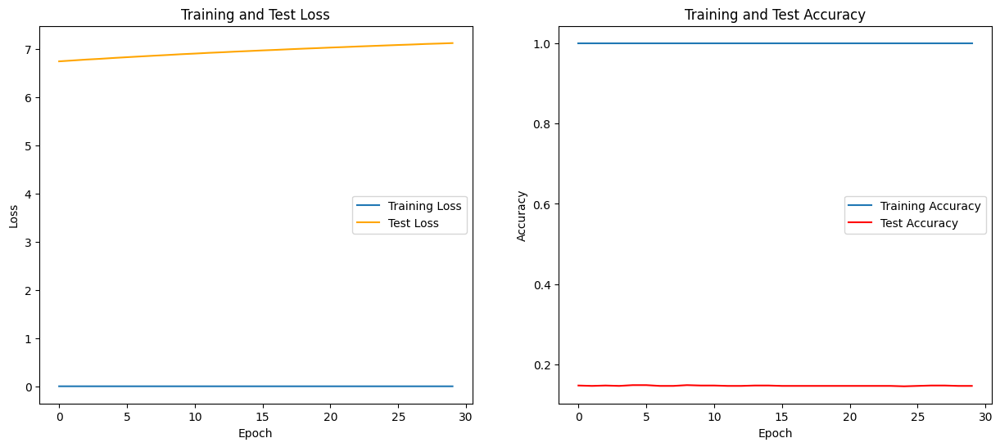

In [43]:
# Plotting the training and test loss
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.plot(epoch_losses, label='Training Loss')
plt.plot(epoch_test_losses, label='Test Loss', color='orange')
plt.title('Training and Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plotting the training and test accuracy
plt.subplot(1, 2, 2)
plt.plot(epoch_train_accuracies, label='Training Accuracy')
plt.plot(epoch_test_accuracies, label='Test Accuracy', color='red')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


In [44]:
# Evaluate the baseline model on the test set
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model_baseline(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the baseline model on the test set: {100 * correct / total}%')

Accuracy of the baseline model on the test set: 14.705882352941176%


This clearly shows overfitting, lets try with pre-trained model to see if that works better.

## B) Use a pre-trained model to answer question (A).

In [45]:
# Load a pretrained model
myModel = models.efficientnet_b1(pretrained=cfg['shouldPretrained'])

In [46]:
# Freeze all parameters if required
if cfg['shouldFreeze']:
    for param in myModel.parameters():
        param.requires_grad = False

In [47]:
# Change last layer
num_ftrs = myModel.classifier[1].in_features  # 1280 features for the last layer
myModel.classifier = nn.Linear(num_ftrs, cfg["nbr_classes"])

In [48]:
# Initialize the model, loss function, and optimizer
optimizer_pretrained = optim.SGD(myModel.parameters(), lr=0.001, momentum=0.9)

In [49]:
# # Move the model to the device
# myModel = myModel.to(device)

# # Training the pre-trained model
# for epoch in range(epochs):
#     running_loss = 0.0
#     for i, data in enumerate(trainloader, 0):
#         inputs, labels = data[0].to(device), data[1].to(device)
#         optimizer_pretrained.zero_grad()
#         outputs = myModel(inputs)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer_pretrained.step()
#         running_loss += loss.item()
#     print(f'Epoch {epoch+1}, Loss: {running_loss / len(trainloader)}')

In [50]:
# Move the model to the device
myModel = myModel.to(device)

# Lists to keep track of metrics
epoch_train_losses = []
epoch_test_losses = []
epoch_train_accuracies = []
epoch_test_accuracies = []

epochs = 30
for epoch in range(epochs):
    myModel.train()  # Set the model to training mode
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    # Training loop
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data[0].to(device), data[1].to(device)
        optimizer_pretrained.zero_grad()
        outputs = myModel(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer_pretrained.step()
        running_loss += loss.item()

        # Calculate training accuracy
        _, train_predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (train_predicted == labels).sum().item()

    train_loss = running_loss / len(trainloader)
    train_accuracy = train_correct / train_total
    epoch_train_losses.append(train_loss)
    epoch_train_accuracies.append(train_accuracy)

    # Test loop for each epoch
    myModel.eval()  # Set the model to evaluation mode
    test_loss = 0.0
    test_correct = 0
    test_total = 0
    with torch.no_grad():
        for data in testloader:
            inputs, labels = data[0].to(device), data[1].to(device)
            outputs = myModel(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            # Calculate test accuracy
            _, test_predicted = torch.max(outputs, 1)
            test_total += labels.size(0)
            test_correct += (test_predicted == labels).sum().item()

    test_loss = test_loss / len(testloader)
    test_accuracy = test_correct / test_total
    epoch_test_losses.append(test_loss)
    epoch_test_accuracies.append(test_accuracy)

    print(f'Epoch {epoch+1}, Training Loss: {train_loss}, Training Accuracy: {train_accuracy}, Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')


Epoch 1, Training Loss: 4.624688267707825, Training Accuracy: 0.020588235294117647, Test Loss: 4.586650848388672, Test Accuracy: 0.028431372549019607
Epoch 2, Training Loss: 4.511731490492821, Training Accuracy: 0.050980392156862744, Test Loss: 4.499985918402672, Test Accuracy: 0.058823529411764705
Epoch 3, Training Loss: 4.411569982767105, Training Accuracy: 0.10686274509803921, Test Loss: 4.420585885643959, Test Accuracy: 0.10784313725490197
Epoch 4, Training Loss: 4.302986815571785, Training Accuracy: 0.1803921568627451, Test Loss: 4.336688205599785, Test Accuracy: 0.1627450980392157
Epoch 5, Training Loss: 4.192616894841194, Training Accuracy: 0.30196078431372547, Test Loss: 4.259984530508518, Test Accuracy: 0.2411764705882353
Epoch 6, Training Loss: 4.087459892034531, Training Accuracy: 0.396078431372549, Test Loss: 4.184462495148182, Test Accuracy: 0.30098039215686273
Epoch 7, Training Loss: 3.9832991659641266, Training Accuracy: 0.5098039215686274, Test Loss: 4.104151047766209, 

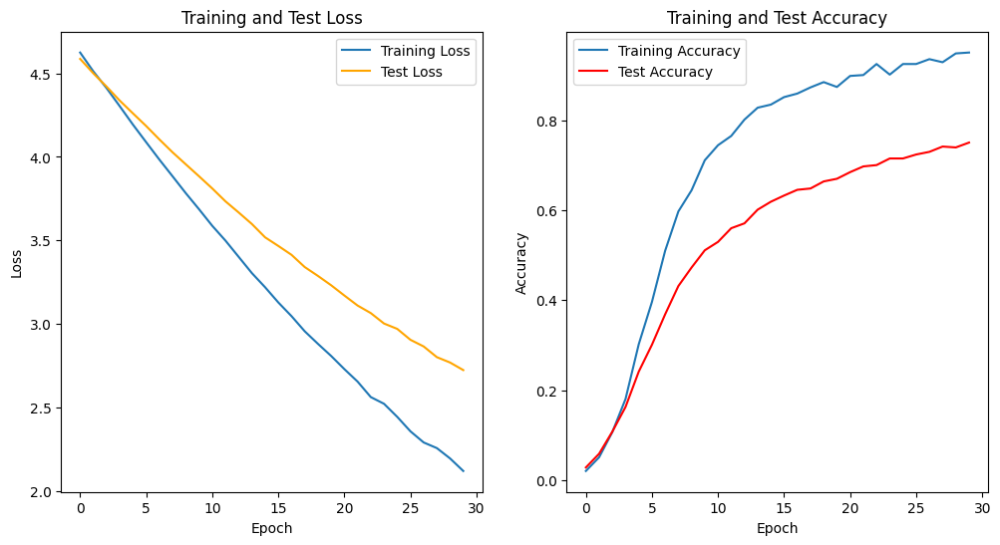

In [51]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot training and test loss
plt.subplot(1, 2, 1)
plt.plot(epoch_train_losses, label='Training Loss')
plt.plot(epoch_test_losses, label='Test Loss', color='orange')
plt.title('Training and Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and test accuracy
plt.subplot(1, 2, 2)
plt.plot(epoch_train_accuracies, label='Training Accuracy')
plt.plot(epoch_test_accuracies, label='Test Accuracy', color='red')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


In [52]:
# Evaluate the pre-trained model on the test set
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = myModel(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the pre-trained model on the test set: {100 * correct / total}%')

Accuracy of the pre-trained model on the test set: 75.0%


In [ ]:
## The accuracy has greatly improved with pre-trained model. 

# C) Report the predicted classes for the 50 images in the zip folder examples_flowers.zip

In [ ]:
#Mounting Gdrive
from google.colab import drive

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [20]:
# Extract the zip folder
zip_ref = zipfile.ZipFile("examples_flowers.zip", 'r')
zip_ref.extractall("examples_flowers")
zip_ref.close()

In [53]:
# Create a list to store the predicted classes
predicted_classes = []

test_path = 'examples_flowers/examples_flowers'
# Loop through the images in the folder
for filename in os.listdir(test_path):
    if filename.endswith('.jpg'):
        # Open the image
        print(f'Image {filename} is now processed')
        img = Image.open(os.path.join(test_path, filename))
        # Apply the transformation
        img = transform(img)
        # Add batch dimension
        img = img.unsqueeze(0).to(device)
        # Perform inference
        with torch.no_grad():
            output = model_baseline(img)
            _, predicted = torch.max(output, 1)
            predicted_classes.append(predicted.item())

Image image00.jpg is now processed
Image image01.jpg is now processed
Image image02.jpg is now processed
Image image03.jpg is now processed
Image image04.jpg is now processed
Image image05.jpg is now processed
Image image06.jpg is now processed
Image image07.jpg is now processed
Image image08.jpg is now processed
Image image09.jpg is now processed
Image image10.jpg is now processed
Image image11.jpg is now processed
Image image12.jpg is now processed
Image image13.jpg is now processed
Image image14.jpg is now processed
Image image15.jpg is now processed
Image image16.jpg is now processed
Image image17.jpg is now processed
Image image18.jpg is now processed
Image image19.jpg is now processed
Image image20.jpg is now processed
Image image21.jpg is now processed
Image image22.jpg is now processed
Image image23.jpg is now processed
Image image24.jpg is now processed
Image image25.jpg is now processed
Image image26.jpg is now processed
Image image27.jpg is now processed
Image image28.jpg is

In [54]:
# Print the predicted classes
print("Predicted classes for the images:")
print(predicted_classes)


Predicted classes for the images:
[86, 49, 51, 13, 15, 92, 43, 12, 88, 72, 5, 80, 54, 57, 49, 55, 63, 12, 71, 90, 88, 67, 1, 66, 48, 54, 64, 57, 77, 39, 92, 47, 55, 32, 40, 80, 55, 15, 1, 49, 28, 40, 47, 29, 52, 7, 57, 88, 29, 96]


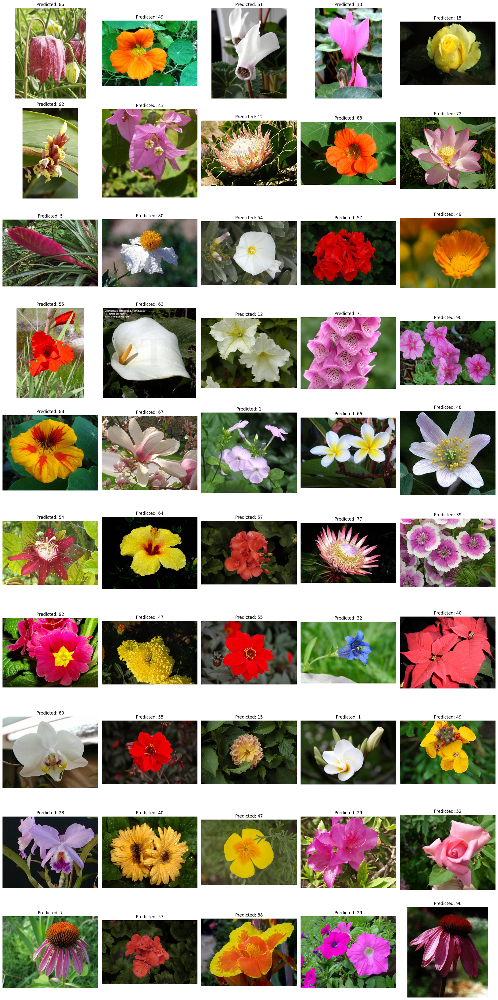

In [55]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torchvision import transforms


test_path = 'examples_flowers/examples_flowers'
predicted_classes = []

# Get all jpg filenames in the test_path
image_filenames = [filename for filename in os.listdir(test_path) if filename.endswith('.jpg')]

# Determine the number of rows needed to display the images
num_rows = len(image_filenames) // 5 + (len(image_filenames) % 5 != 0)

# Set up the matplotlib figure and axes
fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Loop through the images in the folder and plot them
for i, filename in enumerate(image_filenames):
    # Open the image
    img_path = os.path.join(test_path, filename)
    img = Image.open(img_path)
    
    # Apply the transformation and add batch dimension
    img_transformed = transform(img).unsqueeze(0).to(device)
    
    # Perform inference
    with torch.no_grad():
        output = model_baseline(img_transformed)
        _, predicted = torch.max(output, 1)
        predicted_classes.append(predicted.item())

    # Plotting the image
    ax = axes[i]
    ax.imshow(img)
    ax.set_title(f'Predicted: {predicted.item()}')
    ax.axis('off')

# Turn off any remaining axes not used
for ax in axes[i+1:]:
    ax.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
